# Libraries

In [1]:
# default libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.linear_model import LinearRegression
import time
import math

In [2]:
# plotting configuration
sns.set(style = 'darkgrid',
        font_scale = 1.4,
        rc = {"lines.linewidth": 2,
          "figure.figsize": (12, 8)})

sns.set_palette('Set2')

In [154]:
from tools import get_exponential_bins, compute_quantile_hist_data, compute_interval_score
from hyp_tests import percentile_bootstrap_ci_ratio_cookie_buckets, bc_a_bootstrap_ratio_cookie_buckets,\
jackknife_cookie_bucket_quantile_bucketed
from data_gen import generate_raw_data_lognormal, generate_raw_data_exponential,\
generate_raw_data,get_binned_data_cookie_bucket_level, generate_data_mixture_exp_bucket_level
from hyp_tests import compute_pseudovals_jackknife
from scipy.stats import shapiro, norm, pearsonr, t
import statsmodels.api as sm

# Simulations

## Lognormal setting

In [4]:
bins_boundaries= get_exponential_bins(10,600000,100)
num_of_cookie_buckets=20

In [5]:
cand_num_of_cookie_buckets = np.arange(10,110,step=10).tolist()

In [39]:
num_of_sims=1000
threshold=0.001

In [128]:
lognormal_means_50 = list()
lognormal_sample_var_50 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    lognormal_means_50+=[[]]
    lognormal_sample_var_50+=[[]]

In [299]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        # bin raw data and place the clients into cookie buckets
        bucketed_data_treat = get_binned_data_cookie_bucket_level(raw_data_treatment,cur_num_of_cookie_buckets, bins_boundaries).values
        bucketed_data_control = get_binned_data_cookie_bucket_level(raw_data_control,cur_num_of_cookie_buckets, bins_boundaries).values
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(bucketed_data_treat,bucketed_data_control,bins_boundaries,0.5)
        
        lognormal_means_50[cur_ind] += [np.mean(pseudo_vals)]
        lognormal_sample_var_50[cur_ind] += [np.var(pseudo_vals,ddof=1)]


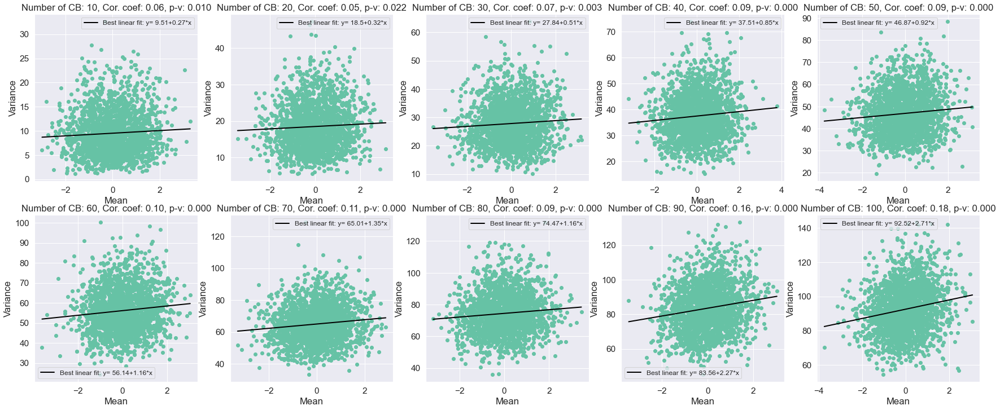

In [300]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    cor_coef, pval = pearsonr(lognormal_sample_var_50[i],lognormal_means_50[i])
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}, Cor. coef: {:.2f}, p-v: {:.3f}'.format(cur_number_of_buckets, cor_coef, pval))
    plt.scatter(lognormal_means_50[i],lognormal_sample_var_50[i])
    reg_1 = LinearRegression().fit(np.array(lognormal_means_50[i]).reshape(-1,1),np.array(lognormal_sample_var_50[i]))
    x_range = np.linspace(min(lognormal_means_50[i]), max(lognormal_means_50[i]))
    plt.plot(x_range ,reg_1.intercept_ + reg_1.coef_ * x_range, color='black', label='Best linear fit: y= ' + 
    str(reg_1.intercept_.round(2)) +'+' +str(reg_1.coef_.round(2)[0])+"*x")
    plt.legend(prop={'size': 12})
    plt.xlabel('Mean')
    plt.ylabel('Variance')


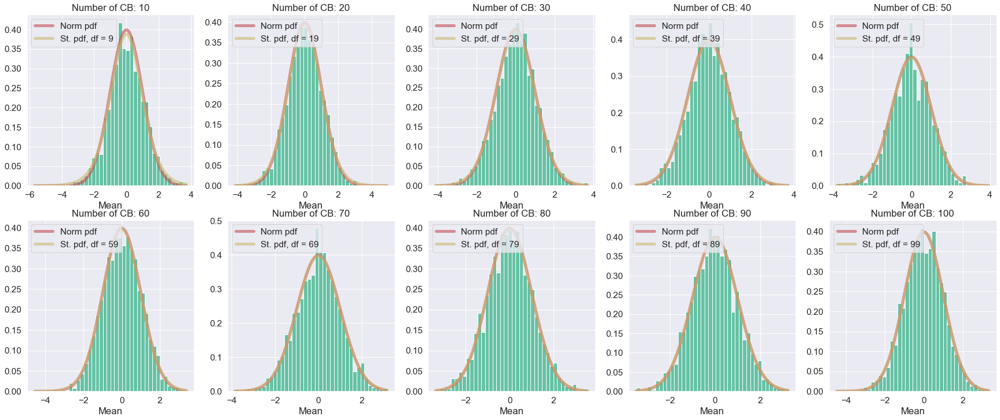

In [439]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(lognormal_means_50[i])/np.sqrt(np.array(lognormal_sample_var_50[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)

    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('lognormal_clt_approx_median.png', bbox_inches='tight')

In [162]:
import scipy.stats as stats

In [ ]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(lognormal_means_50[i])/np.sqrt(np.array(lognormal_sample_var_50[i])/cur_number_of_buckets)
    stats.probplot(t_stat, dist=stats.t, sparams=(cur_number_of_buckets-1), plot=plt, fit=False)


# 95th percentile

In [132]:
num_of_sims=1000

In [133]:
lognormal_means_95 = list()
lognormal_sample_var_95 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    lognormal_means_95 += [[]]
    lognormal_sample_var_95 += [[]]

In [302]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        # bin raw data and place the clients into cookie buckets
        bucketed_data_treat = get_binned_data_cookie_bucket_level(raw_data_treatment,cur_num_of_cookie_buckets, bins_boundaries).values
        bucketed_data_control = get_binned_data_cookie_bucket_level(raw_data_control,cur_num_of_cookie_buckets, bins_boundaries).values
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(bucketed_data_treat,bucketed_data_control,bins_boundaries,0.95)
        
        lognormal_means_95[cur_ind] += [np.mean(pseudo_vals)]
        lognormal_sample_var_95[cur_ind] += [np.var(pseudo_vals,ddof=1)]


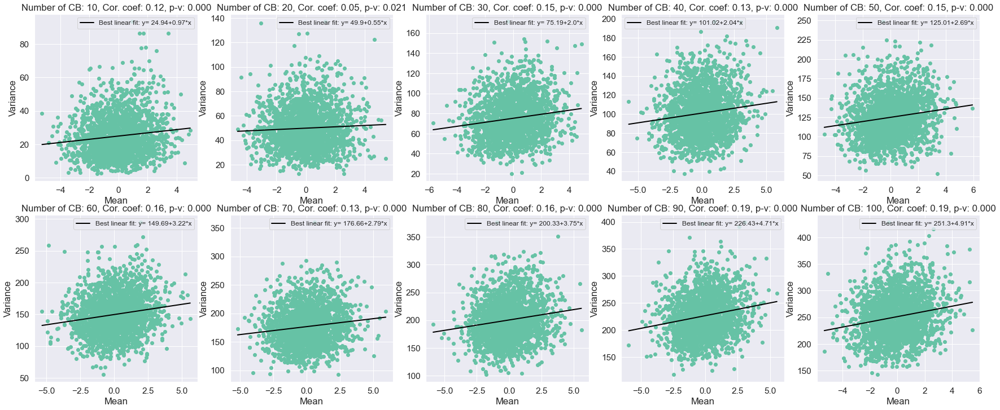

In [303]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    cor_coef, pval = pearsonr(lognormal_sample_var_95[i],lognormal_means_95[i])
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}, Cor. coef: {:.2f}, p-v: {:.3f}'.format(cur_number_of_buckets, cor_coef, pval))
    plt.scatter(lognormal_means_95[i],lognormal_sample_var_95[i])
    reg_1 = LinearRegression().fit(np.array(lognormal_means_95[i]).reshape(-1,1),np.array(lognormal_sample_var_95[i]))
    x_range = np.linspace(min(lognormal_means_95[i]), max(lognormal_means_95[i]))
    plt.plot(x_range ,reg_1.intercept_ + reg_1.coef_ * x_range, color='black', label='Best linear fit: y= ' + 
    str(reg_1.intercept_.round(2)) +'+' +str(reg_1.coef_.round(2)[0])+"*x")
    plt.legend(prop={'size': 12})
    plt.xlabel('Mean')
    plt.ylabel('Variance')


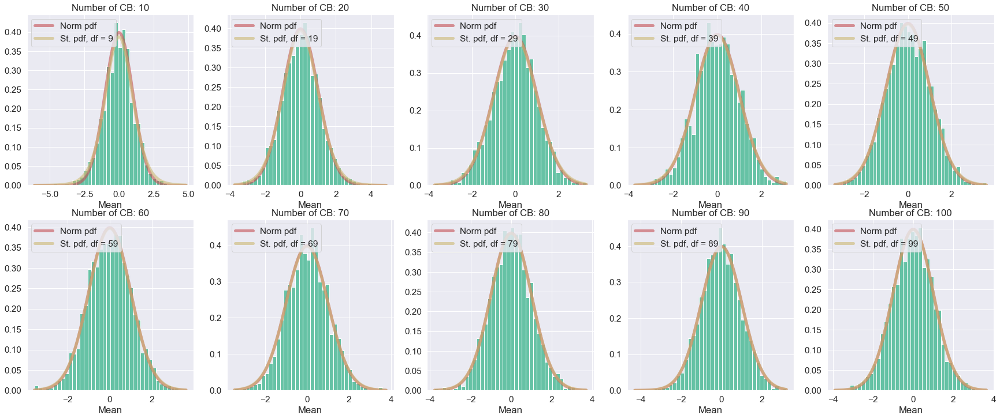

In [304]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(lognormal_means_95[i])/np.sqrt(np.array(lognormal_sample_var_95[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)
    
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('lognormal_clt_approx_95.pdf', bbox_inches='tight')

In [ ]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(lognormal_means_95[i])/np.sqrt(np.array(lognormal_sample_var_95[i])/cur_number_of_buckets)
    stats.probplot(t_stat, dist=stats.t, sparams=(cur_number_of_buckets-1), plot=plt, fit=False)


# 99th percentile

In [137]:
lognormal_means_99 = list()
lognormal_sample_var_99 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    lognormal_means_99 += [[]]
    lognormal_sample_var_99 += [[]]

In [305]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        # bin raw data and place the clients into cookie buckets
        bucketed_data_treat = get_binned_data_cookie_bucket_level(raw_data_treatment,cur_num_of_cookie_buckets, bins_boundaries).values
        bucketed_data_control = get_binned_data_cookie_bucket_level(raw_data_control,cur_num_of_cookie_buckets, bins_boundaries).values
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(bucketed_data_treat,bucketed_data_control,bins_boundaries,0.99)
        
        lognormal_means_99[cur_ind] += [np.mean(pseudo_vals)]
        lognormal_sample_var_99[cur_ind] += [np.var(pseudo_vals,ddof=1)]


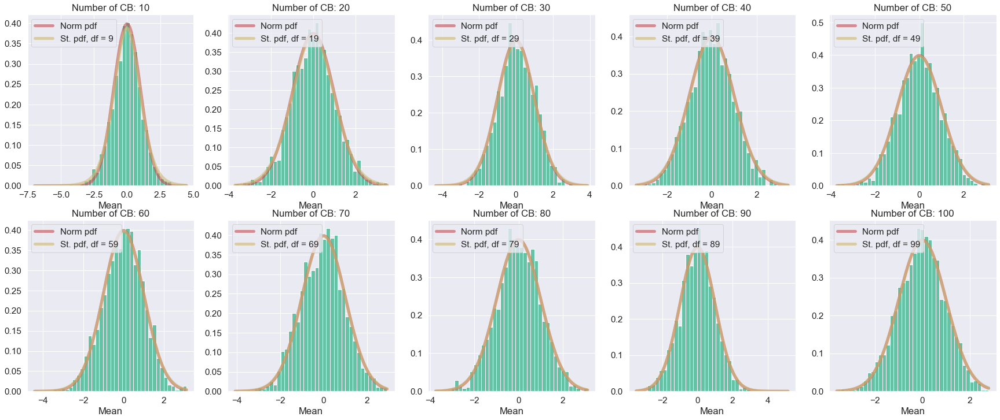

In [307]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(lognormal_means_99[i])/np.sqrt(np.array(lognormal_sample_var_99[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)
    
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)  
plt.savefig('lognormal_clt_approx_99.pdf', bbox_inches='tight')

In [ ]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(lognormal_means_99[i])/np.sqrt(np.array(lognormal_sample_var_99[i])/cur_number_of_buckets)
    stats.probplot(t_stat, dist=stats.t, sparams=(cur_number_of_buckets-1), plot=plt, fit=False)


## One corrupted cookie bucket setting

In [141]:
from data_gen import generate_data_single_corrupted_exp_bucket_level

In [142]:
one_cor_means_50 = list()
one_cor_sample_var_50 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    one_cor_means_50 += [[]]
    one_cor_sample_var_50 += [[]]

In [308]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        dataset_treat, dataset_control = generate_data_single_corrupted_exp_bucket_level([1000,1000],[250,800],cur_num_of_cookie_buckets,bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(dataset_treat,dataset_control,bins_boundaries, 0.5)

        
        one_cor_means_50[cur_ind] += [np.mean(pseudo_vals)]
        one_cor_sample_var_50[cur_ind] += [np.var(pseudo_vals,ddof=1)]

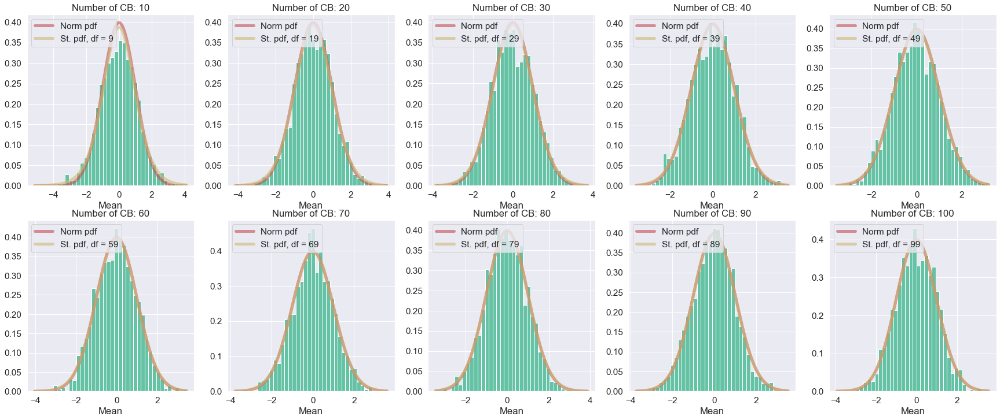

In [310]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(one_cor_means_50[i])/np.sqrt(np.array(one_cor_sample_var_50[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)
    
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)


In [ ]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(one_cor_means_50[i])/np.sqrt(np.array(one_cor_sample_var_50[i])/cur_number_of_buckets)
    stats.probplot(t_stat, dist=stats.t, sparams=(cur_number_of_buckets-1), plot=plt, fit=False)


### less extreme

In [146]:
one_cor_means_50 = list()
one_cor_sample_var_50 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    one_cor_means_50 += [[]]
    one_cor_sample_var_50 += [[]]

In [311]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        dataset_treat, dataset_control = generate_data_single_corrupted_exp_bucket_level([1000,1000],[250,400],cur_num_of_cookie_buckets,bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(dataset_treat,dataset_control,bins_boundaries, 0.5)

        
        one_cor_means_50[cur_ind] += [np.mean(pseudo_vals)]
        one_cor_sample_var_50[cur_ind] += [np.var(pseudo_vals,ddof=1)]

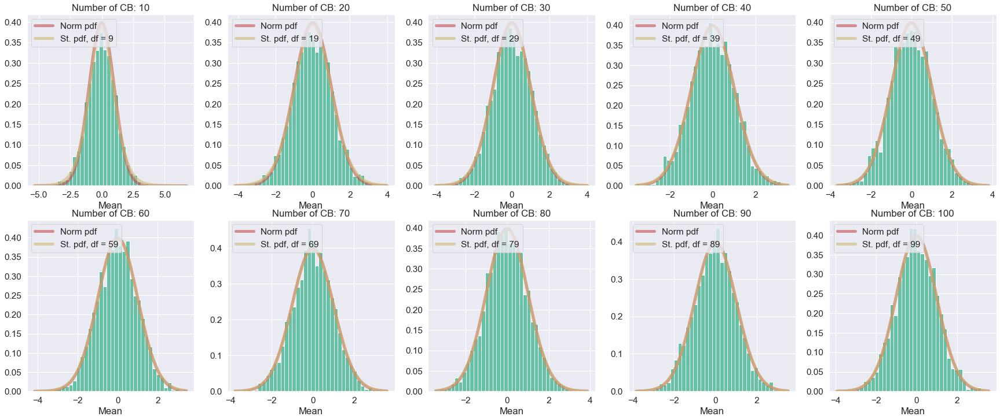

In [313]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(one_cor_means_50[i])/np.sqrt(np.array(one_cor_sample_var_50[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)

In [ ]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(one_cor_means_50[i])/np.sqrt(np.array(one_cor_sample_var_50[i])/cur_number_of_buckets)
    stats.probplot(t_stat, dist=stats.t, sparams=(cur_number_of_buckets-1), plot=plt, fit=False)


### 95th percentile

In [150]:
one_cor_means_95 = list()
one_cor_sample_var_95 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    one_cor_means_95 += [[]]
    one_cor_sample_var_95 += [[]]

In [314]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        dataset_treat, dataset_control = generate_data_single_corrupted_exp_bucket_level([1000,1000],[250,800],cur_num_of_cookie_buckets,bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(dataset_treat, dataset_control, bins_boundaries, 0.95)

        
        one_cor_means_95[cur_ind] += [np.mean(pseudo_vals)]
        one_cor_sample_var_95[cur_ind] += [np.var(pseudo_vals,ddof=1)]

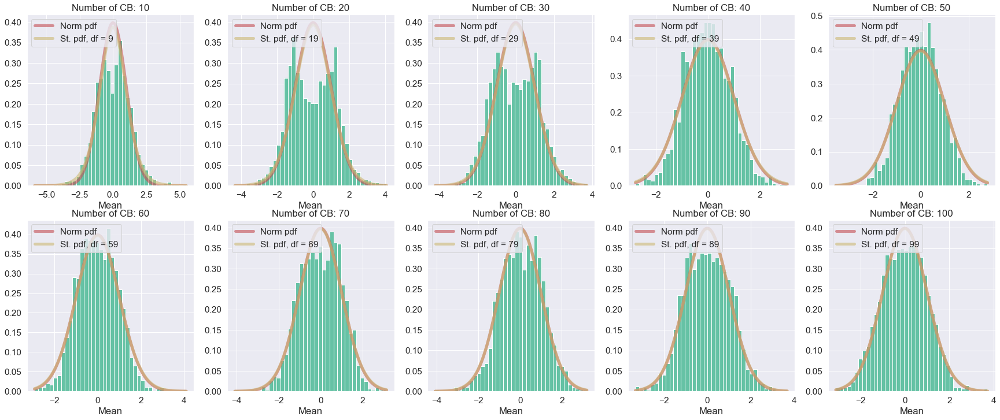

In [316]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(one_cor_means_95[i])/np.sqrt(np.array(one_cor_sample_var_95[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('onecor_clt_approx_95.pdf', bbox_inches='tight')

In [ ]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(one_cor_means_95[i])/np.sqrt(np.array(one_cor_sample_var_95[i])/cur_number_of_buckets)
    stats.probplot(t_stat, dist=stats.t, sparams=(cur_number_of_buckets-1), plot=plt, fit=False)


### Few users

In [173]:
few_lognormal_means_50 = list()
few_lognormal_sample_var_50 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    few_lognormal_means_50 += [[]]
    few_lognormal_sample_var_50 += [[]]

In [174]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 200, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 200, mean_param=7,sigma_param=1)

        # bin raw data and place the clients into cookie buckets
        bucketed_data_treat = get_binned_data_cookie_bucket_level(raw_data_treatment,cur_num_of_cookie_buckets, bins_boundaries).values
        bucketed_data_control = get_binned_data_cookie_bucket_level(raw_data_control,cur_num_of_cookie_buckets, bins_boundaries).values
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(bucketed_data_treat,bucketed_data_control,bins_boundaries,0.5)
        
        few_lognormal_means_50[cur_ind] += [np.mean(pseudo_vals)]
        few_lognormal_sample_var_50[cur_ind] += [np.var(pseudo_vals,ddof=1)]


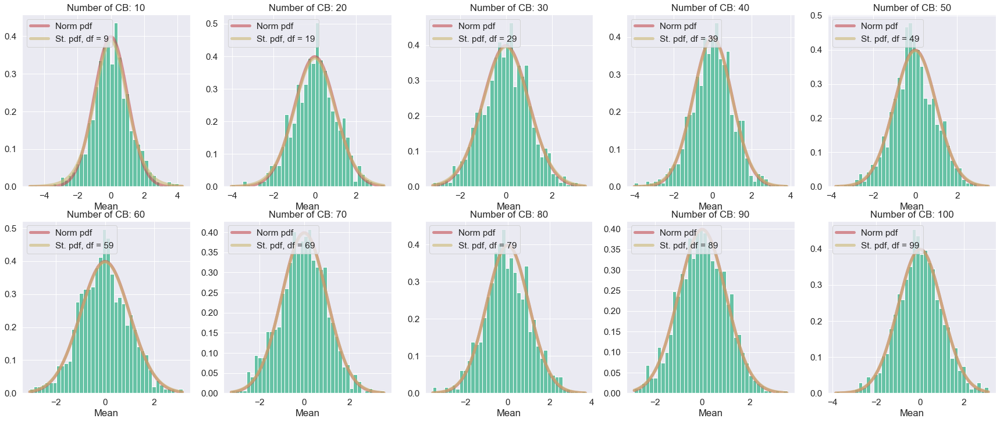

In [264]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(few_lognormal_means_50[i])/np.sqrt(np.array(few_lognormal_sample_var_50[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)
    
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)  

In [ ]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(few_lognormal_means_50[i])/np.sqrt(np.array(few_lognormal_sample_var_50[i])/cur_number_of_buckets)
    stats.probplot(t_stat, dist=stats.t, sparams=(cur_number_of_buckets-1), plot=plt, fit=False)


### Checking for the mean

### EXACT mean for the lognormal case

In [224]:
exact_mean_lognormal_means_50 = list()
exact_mean_lognormal_sample_var_50 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    exact_mean_lognormal_means_50 += [[]]
    exact_mean_lognormal_sample_var_50 += [[]]

In [397]:
num_of_sims=1000

In [317]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        treatment_bucket_id = raw_data_treatment['Client ID'] % cur_num_of_cookie_buckets
        control_bucket_id = raw_data_control['Client ID'] % cur_num_of_cookie_buckets

        pseudo_vals = list()

        total_mean_treatment = raw_data_treatment['Metric Value'].mean()
        total_mean_control = raw_data_control['Metric Value'].mean()

        total_percent_change = 100 * (total_mean_treatment / total_mean_control - 1)

        for cur_bucket in range(cur_num_of_cookie_buckets):
            mean_tr = raw_data_treatment['Metric Value'][treatment_bucket_id!=cur_bucket].mean()
            mean_control = raw_data_control['Metric Value'][control_bucket_id!=cur_bucket].mean()
            cur_percent_change = 100 * (mean_tr / mean_control - 1)
            pseudo_vals+=[cur_num_of_cookie_buckets * total_percent_change - (cur_num_of_cookie_buckets-1) * cur_percent_change]


        exact_mean_lognormal_means_50[cur_ind] += [np.mean(pseudo_vals)]
        exact_mean_lognormal_sample_var_50[cur_ind] += [np.var(pseudo_vals,ddof=1)]


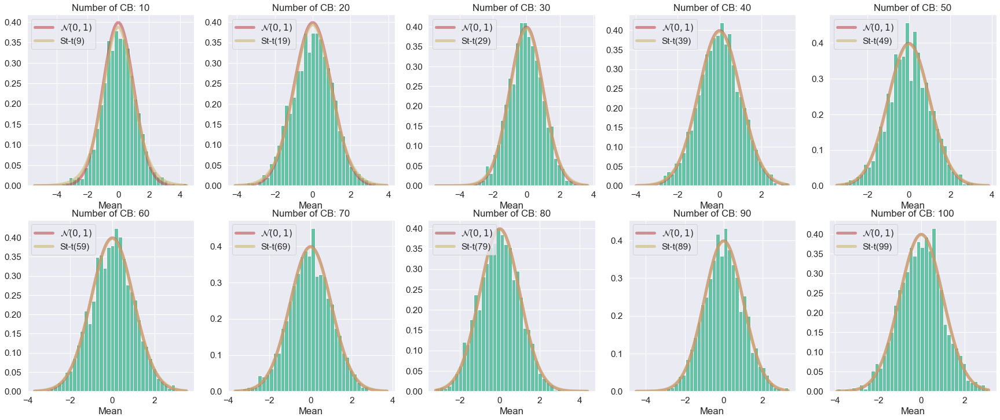

In [446]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(exact_mean_lognormal_means_50[i])/np.sqrt(np.array(exact_mean_lognormal_sample_var_50[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)

    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='$\mathcal{N}(0,1)$')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St-t({:d})'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('clt_exact_mean_logn.pdf', bbox_inches='tight')

p-vals for exact mean

In [396]:
from scipy.stats import shapiro

In [416]:
p_vals_exact_mean = list()

In [417]:
for cookie_bucket in cand_num_of_cookie_buckets:
    p_vals_exact_mean += [[]]

In [418]:
num_of_sims=2000

In [419]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        treatment_bucket_id = raw_data_treatment['Client ID'] % cur_num_of_cookie_buckets
        control_bucket_id = raw_data_control['Client ID'] % cur_num_of_cookie_buckets

        pseudo_vals = list()

        total_mean_treatment = raw_data_treatment['Metric Value'].mean()
        total_mean_control = raw_data_control['Metric Value'].mean()

        total_percent_change = 100 * (total_mean_treatment / total_mean_control - 1)

        for cur_bucket in range(cur_num_of_cookie_buckets):
            mean_tr = raw_data_treatment['Metric Value'][treatment_bucket_id!=cur_bucket].mean()
            mean_control = raw_data_control['Metric Value'][control_bucket_id!=cur_bucket].mean()
            cur_percent_change = 100 * (mean_tr / mean_control - 1)
            pseudo_vals+=[cur_num_of_cookie_buckets * total_percent_change - (cur_num_of_cookie_buckets-1) * cur_percent_change]
        
        p_val = shapiro(pseudo_vals)[1]
        p_vals_exact_mean[cur_ind]+=[p_val]



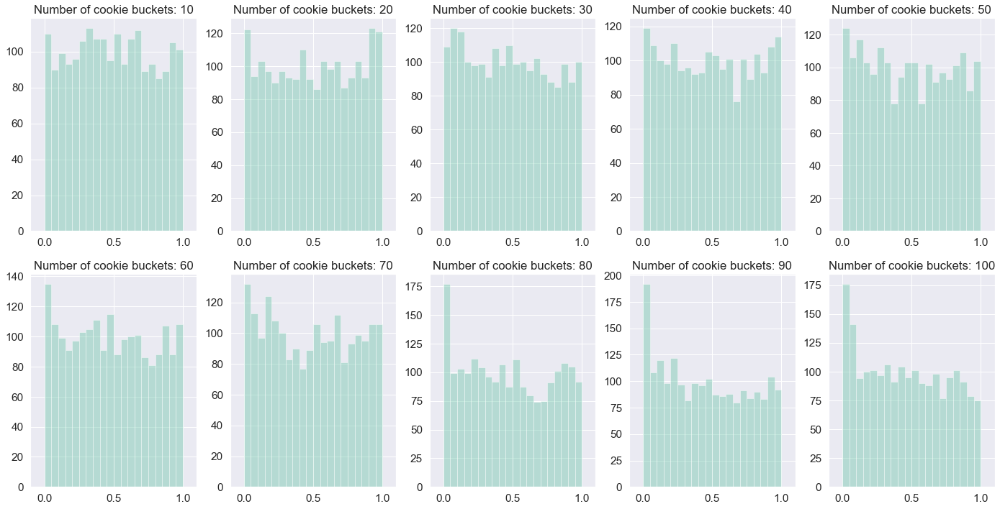

In [444]:
plt.figure(figsize=[24,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of cookie buckets: {:d}'.format(cur_number_of_buckets))
    sns.distplot(p_vals_exact_mean[i], bins=20, norm_hist=False, kde=False)
    plt.xlim([-0.1,1.1])
plt.savefig('pvals_exact_mean.pdf', bbox_inches='tight')

### ideal case - Shapiro-Wilk

In [433]:
p_vals_gaussian = list()

In [434]:
for cookie_bucket in cand_num_of_cookie_buckets:
    p_vals_gaussian += [[]]

In [435]:
num_of_sims=20000

In [436]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):

        pseudo_vals = np.random.normal(scale=10,size=cur_num_of_cookie_buckets)

        p_val = shapiro(pseudo_vals)[1]
        p_vals_gaussian[cur_ind]+=[p_val]



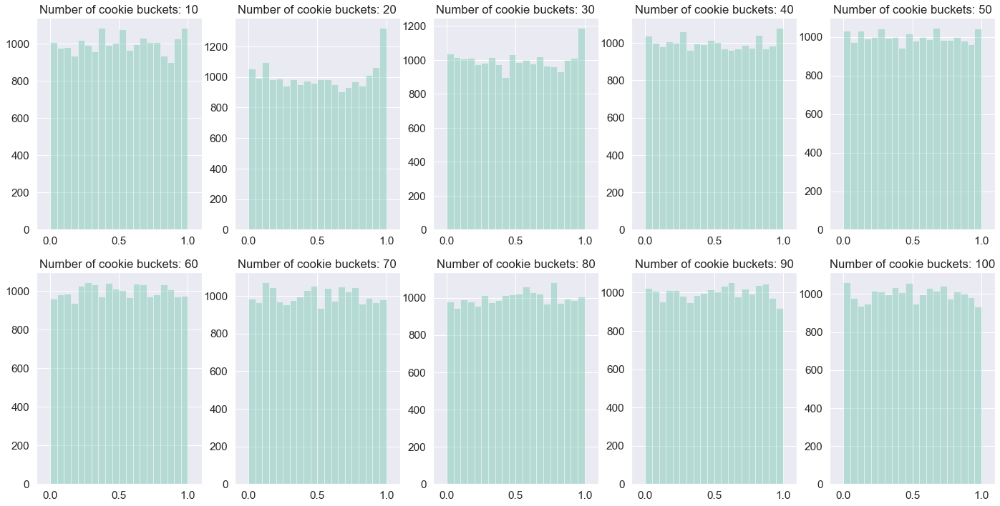

In [443]:
plt.figure(figsize=[24,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of cookie buckets: {:d}'.format(cur_number_of_buckets))
    sns.distplot(p_vals_gaussian[i], bins=20, norm_hist=False, kde=False)
    plt.xlim([-0.1,1.1])
plt.savefig('pvals_gaussian.pdf', bbox_inches='tight')

## Exponential case

In [228]:
exact_mean_exp_means = list()
exact_mean_exp_sample_var = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    exact_mean_exp_means += [[]]
    exact_mean_exp_sample_var += [[]]

In [319]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_exponential(number_of_users = 1000, scale_param=500)
        raw_data_control = generate_raw_data_exponential(number_of_users = 1000, scale_param=500)

        treatment_bucket_id = raw_data_treatment['Client ID'] % cur_num_of_cookie_buckets
        control_bucket_id = raw_data_control['Client ID'] % cur_num_of_cookie_buckets

        pseudo_vals = list()

        total_mean_treatment = raw_data_treatment['Metric Value'].mean()
        total_mean_control = raw_data_control['Metric Value'].mean()

        total_percent_change = 100 * (total_mean_treatment / total_mean_control - 1)

        for cur_bucket in range(cur_num_of_cookie_buckets):
            mean_tr = raw_data_treatment['Metric Value'][treatment_bucket_id!=cur_bucket].mean()
            mean_control = raw_data_control['Metric Value'][control_bucket_id!=cur_bucket].mean()
            cur_percent_change = 100 * (mean_tr / mean_control - 1)
            pseudo_vals+=[cur_num_of_cookie_buckets * total_percent_change - (cur_num_of_cookie_buckets-1) * cur_percent_change]


        exact_mean_exp_means[cur_ind] += [np.mean(pseudo_vals)]
        exact_mean_exp_sample_var[cur_ind] += [np.var(pseudo_vals,ddof=1)]


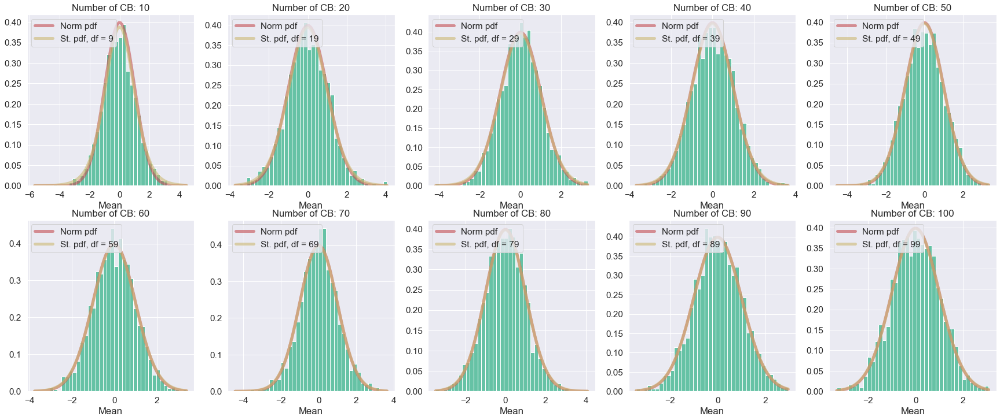

In [445]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(exact_mean_exp_means[i])/np.sqrt(np.array(exact_mean_exp_sample_var[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)

    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('clt_exact_mean_expon.pdf', bbox_inches='tight')

## Exact quantile

In [283]:
num_of_sims=1000

In [284]:
exact_q_lognormal_means_50 = list()
exact_q_lognormal_sample_var_50 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    exact_q_lognormal_means_50 += [[]]
    exact_q_lognormal_sample_var_50 += [[]]

In [287]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        treatment_bucket_id = raw_data_treatment['Client ID'] % cur_num_of_cookie_buckets
        control_bucket_id = raw_data_control['Client ID'] % cur_num_of_cookie_buckets

        pseudo_vals = list()

        total_mean_treatment = raw_data_treatment['Metric Value'].quantile(0.5)
        total_mean_control = raw_data_control['Metric Value'].quantile(0.5)

        total_percent_change = 100 * (total_mean_treatment / total_mean_control - 1)

        for cur_bucket in range(cur_num_of_cookie_buckets):
            mean_tr = raw_data_treatment['Metric Value'][treatment_bucket_id!=cur_bucket].quantile(0.5)
            mean_control = raw_data_control['Metric Value'][control_bucket_id!=cur_bucket].quantile(0.5)
            cur_percent_change = 100 * (mean_tr / mean_control - 1)
            pseudo_vals+=[cur_num_of_cookie_buckets * total_percent_change - (cur_num_of_cookie_buckets-1) * cur_percent_change]


        exact_q_lognormal_means_50[cur_ind] += [np.mean(pseudo_vals)]
        exact_q_lognormal_sample_var_50[cur_ind] += [np.var(pseudo_vals,ddof=1)]


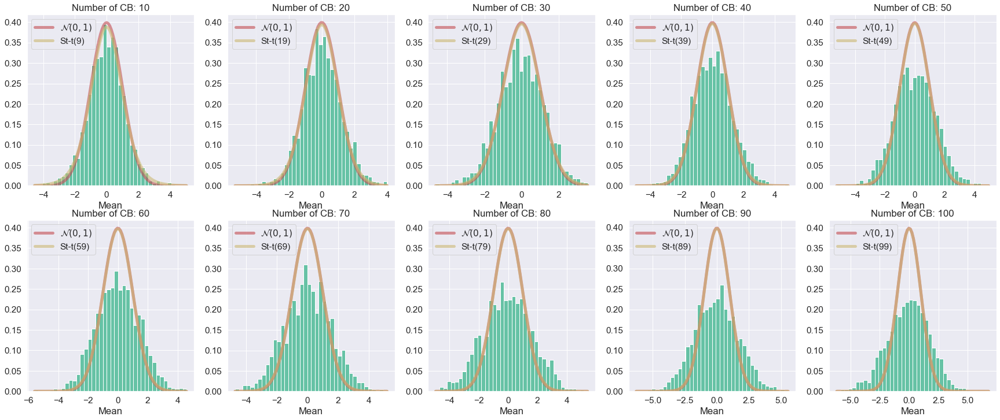

In [447]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(exact_q_lognormal_means_50[i])/np.sqrt(np.array(exact_q_lognormal_sample_var_50[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)

    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='$\mathcal{N}(0,1)$')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St-t({:d})'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('exact_quantile_50.pdf', bbox_inches='tight')

### 95th percentile

In [293]:
exact_q_lognormal_means_95 = list()
exact_q_lognormal_sample_var_95 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    exact_q_lognormal_means_95 += [[]]
    exact_q_lognormal_sample_var_95 += [[]]

In [294]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        treatment_bucket_id = raw_data_treatment['Client ID'] % cur_num_of_cookie_buckets
        control_bucket_id = raw_data_control['Client ID'] % cur_num_of_cookie_buckets

        pseudo_vals = list()

        total_mean_treatment = raw_data_treatment['Metric Value'].quantile(0.95)
        total_mean_control = raw_data_control['Metric Value'].quantile(0.95)

        total_percent_change = 100 * (total_mean_treatment / total_mean_control - 1)

        for cur_bucket in range(cur_num_of_cookie_buckets):
            mean_tr = raw_data_treatment['Metric Value'][treatment_bucket_id!=cur_bucket].quantile(0.95)
            mean_control = raw_data_control['Metric Value'][control_bucket_id!=cur_bucket].quantile(0.95)
            cur_percent_change = 100 * (mean_tr / mean_control - 1)
            pseudo_vals+=[cur_num_of_cookie_buckets * total_percent_change - (cur_num_of_cookie_buckets-1) * cur_percent_change]


        exact_q_lognormal_means_95[cur_ind] += [np.mean(pseudo_vals)]
        exact_q_lognormal_sample_var_95[cur_ind] += [np.var(pseudo_vals,ddof=1)]


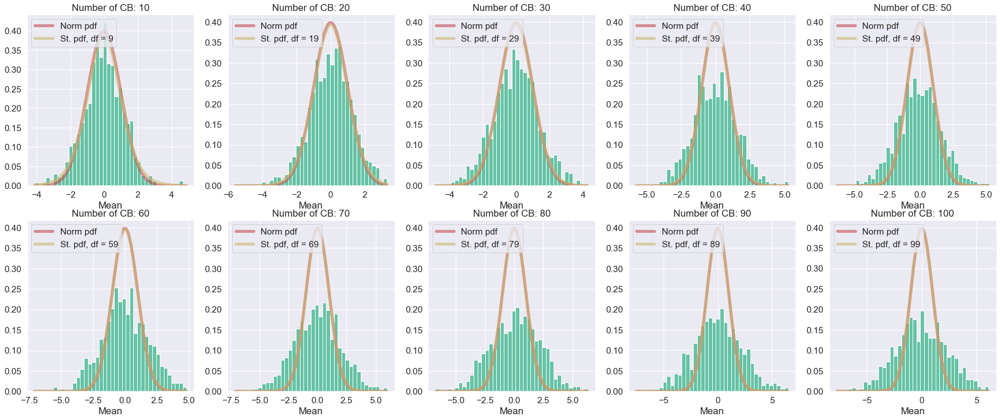

In [448]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(exact_q_lognormal_means_95[i])/np.sqrt(np.array(exact_q_lognormal_sample_var_95[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)

    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('exact_quantile_95.pdf', bbox_inches='tight')

### 99th percentile

In [296]:
exact_q_lognormal_means_99 = list()
exact_q_lognormal_sample_var_99 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    exact_q_lognormal_means_99 += [[]]
    exact_q_lognormal_sample_var_99 += [[]]

In [297]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        raw_data_treatment = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)
        raw_data_control = generate_raw_data_lognormal(number_of_users = 1000, mean_param=7,sigma_param=1)

        treatment_bucket_id = raw_data_treatment['Client ID'] % cur_num_of_cookie_buckets
        control_bucket_id = raw_data_control['Client ID'] % cur_num_of_cookie_buckets

        pseudo_vals = list()

        total_mean_treatment = raw_data_treatment['Metric Value'].quantile(0.99)
        total_mean_control = raw_data_control['Metric Value'].quantile(0.99)

        total_percent_change = 100 * (total_mean_treatment / total_mean_control - 1)

        for cur_bucket in range(cur_num_of_cookie_buckets):
            mean_tr = raw_data_treatment['Metric Value'][treatment_bucket_id!=cur_bucket].quantile(0.99)
            mean_control = raw_data_control['Metric Value'][control_bucket_id!=cur_bucket].quantile(0.99)
            cur_percent_change = 100 * (mean_tr / mean_control - 1)
            pseudo_vals+=[cur_num_of_cookie_buckets * total_percent_change - (cur_num_of_cookie_buckets-1) * cur_percent_change]


        exact_q_lognormal_means_99[cur_ind] += [np.mean(pseudo_vals)]
        exact_q_lognormal_sample_var_99[cur_ind] += [np.var(pseudo_vals,ddof=1)]


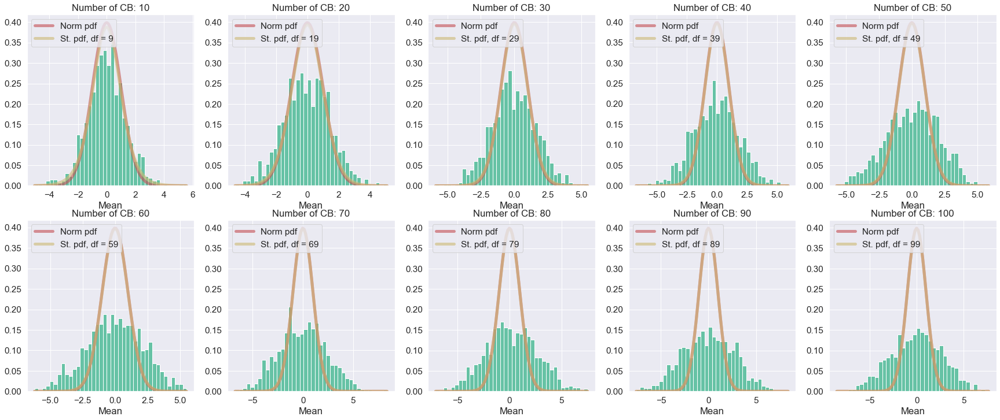

In [449]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(exact_q_lognormal_means_99[i])/np.sqrt(np.array(exact_q_lognormal_sample_var_99[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)

    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('exact_quantile_99.pdf', bbox_inches='tight')

### Gaussian pseudo-values

In [251]:
gauss_pseudo_val_mean = list()
gauss_pseudo_val_sample_var = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    gauss_pseudo_val_mean += [[]]
    gauss_pseudo_val_sample_var += [[]]

In [252]:
num_of_sims=10000

In [253]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):

        pseudo_vals = np.random.normal(scale=10,size=cur_num_of_cookie_buckets)

        gauss_pseudo_val_mean[cur_ind] += [np.mean(pseudo_vals)]
        gauss_pseudo_val_sample_var[cur_ind] += [np.var(pseudo_vals,ddof=1)]


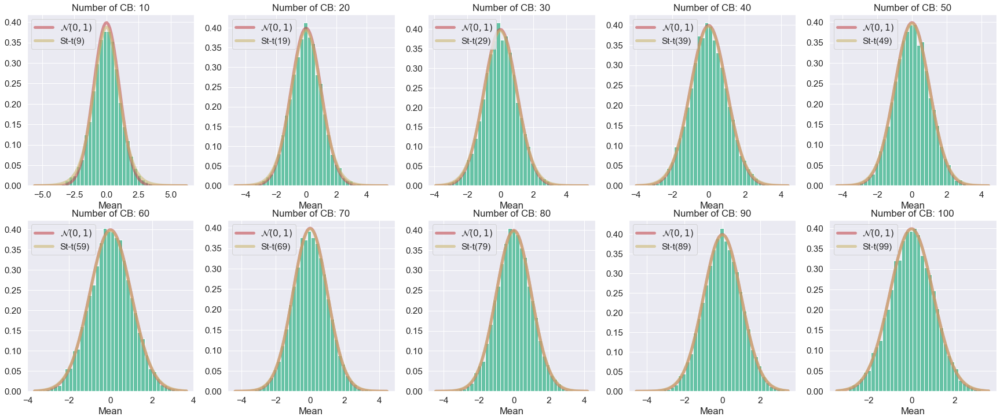

In [442]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(gauss_pseudo_val_mean[i])/np.sqrt(np.array(gauss_pseudo_val_sample_var[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)

    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='$\mathcal{N}(0,1)$')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St-t({:d})'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('gaussian_ps.pdf', bbox_inches='tight')

### Extremely corrupted CB

In [341]:
num_of_sims=4000

In [342]:
extreme_one_cor_means_95 = list()
extreme_one_cor_sample_var_95 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    extreme_one_cor_means_95 += [[]]
    extreme_one_cor_sample_var_95 += [[]]

In [343]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        dataset_treat, dataset_control = generate_data_single_corrupted_exp_bucket_level([1000,1000],[200,2000],cur_num_of_cookie_buckets,bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(dataset_treat, dataset_control, bins_boundaries, 0.95)

        extreme_one_cor_means_95[cur_ind] += [np.mean(pseudo_vals)]
        extreme_one_cor_sample_var_95[cur_ind] += [np.var(pseudo_vals,ddof=1)]

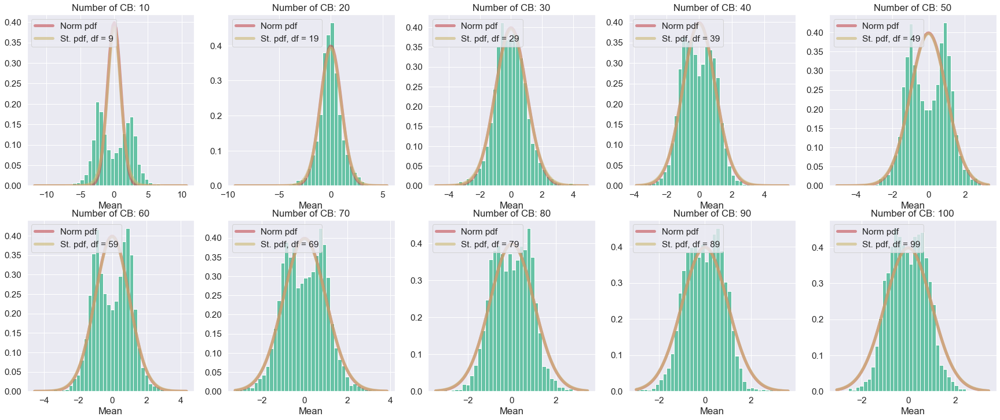

In [440]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(extreme_one_cor_means_95[i])/np.sqrt(np.array(extreme_one_cor_sample_var_95[i])/cur_number_of_buckets)
    plt.hist(t_stat, bins=40,density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat),num=100)
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw=5, alpha=0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range,df = cur_number_of_buckets-1),
       'y-', lw=5, alpha=0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets-1))
    plt.legend(loc=2)
plt.savefig('onecor_clt_fail_95.png', bbox_inches='tight')

In [335]:
dataset_treat, dataset_control = generate_data_single_corrupted_exp_bucket_level([1000,1000], [200,2000], 5, bins_boundaries)

In [336]:
dataset_control.shape

(5, 100)

In [457]:
bins_tuples=[(bins_boundaries[i],bins_boundaries[i+1]) for i in range(len(bins_boundaries)-1)]
bins_midpoints = [np.mean(cur_tuple) for cur_tuple in bins_tuples]

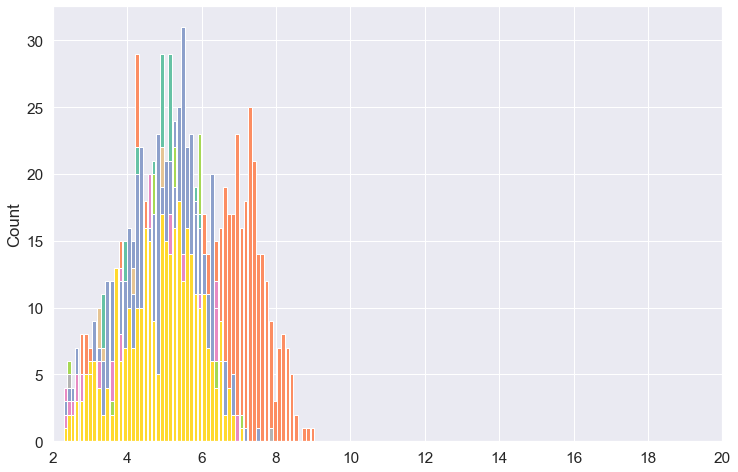

In [508]:
for i in range(70,100):
    plt.bar(np.log(bins_midpoints),dataset_treat[i], width=0.1)
    #plt.xscale('log')
plt.ylabel('Count')
plt.xlim([2,20])
plt.savefig('figs/cor_cb_hist.png',bbox_inches='tight')

In [345]:
extreme_one_cor_means_99 = list()
extreme_one_cor_sample_var_99 = list()
for cookie_bucket in cand_num_of_cookie_buckets:
    extreme_one_cor_means_99 += [[]]
    extreme_one_cor_sample_var_99 += [[]]

In [346]:
for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
    for i in range(num_of_sims):
        dataset_treat, dataset_control = generate_data_single_corrupted_exp_bucket_level([1000, 1000], [200, 2000], cur_num_of_cookie_buckets, bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)
        
        #compute pseudovalues
        pseudo_vals = compute_pseudovals_jackknife(dataset_treat, dataset_control, bins_boundaries, 0.99)

        extreme_one_cor_means_99[cur_ind] += [np.mean(pseudo_vals)]
        extreme_one_cor_sample_var_99[cur_ind] += [np.var(pseudo_vals,ddof=1)]

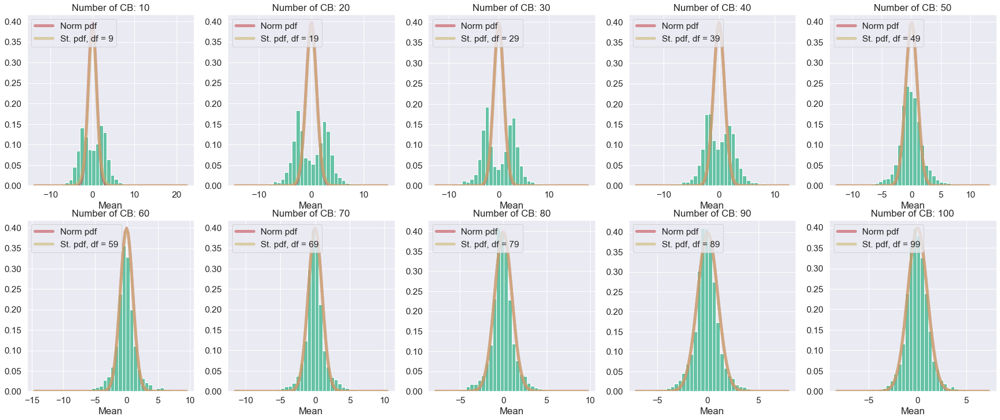

In [441]:
plt.figure(figsize=[30,12])
for i, cur_number_of_buckets in enumerate(cand_num_of_cookie_buckets):
    plt.subplot(2, 5, i+1).set_title('Number of CB: {:d}'.format(cur_number_of_buckets))
    t_stat = np.array(extreme_one_cor_means_99[i]) / np.sqrt(np.array(extreme_one_cor_sample_var_99[i]) / cur_number_of_buckets)
    plt.hist(t_stat, bins=40, density=True)
    plt.xlabel('Mean')

    x_range = np.linspace(min(t_stat), max(t_stat), num = 100)
    plt.plot(x_range, norm.pdf(x_range),
       'r-', lw = 5, alpha = 0.6, label='Norm pdf')

    plt.plot(x_range, t.pdf(x_range, df = cur_number_of_buckets - 1),
       'y-', lw = 5, alpha = 0.6, label='St. pdf, df = {:d}'.format(cur_number_of_buckets - 1))
    plt.legend(loc = 2)
#plt.savefig('onecor_clt_approx_95.pdf', bbox_inches='tight')
plt.savefig('onecor_clt_fail_99.png', bbox_inches='tight')

In [496]:
num_of_sims=1000

In [497]:
one_cor_varying_res_percentile_99=list()
# one_cor_varying_res_bc_a_99=list()
one_cor_varying_res_jack_99=list()

one_cor_varying_length_percentile_99=list()
# one_cor_varying_length_bc_a_99=list()
one_cor_varying_length_jack_99=list()

one_cor_varying_int_score_percentile_99=list()
# one_cor_varying_int_score_bc_a_99=list()
one_cor_varying_int_score_jack_99=list()


for cur_num_of_cookie_buckets in cand_num_of_cookie_buckets:
    one_cor_varying_res_percentile_99+=[[]]
    # one_cor_varying_res_bc_a_99+=[[]]
    one_cor_varying_res_jack_99+=[[]]

    one_cor_varying_length_percentile_99+=[[]]
    # one_cor_varying_length_bc_a_99+=[[]]
    one_cor_varying_length_jack_99+=[[]]

    one_cor_varying_int_score_percentile_99+=[[]]
    # one_cor_varying_int_score_bc_a_99+=[[]]
    one_cor_varying_int_score_jack_99+=[[]]



In [498]:
for i in range(num_of_sims):

    for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
        # generate bucketed data
        dataset_treat, dataset_control=generate_data_single_corrupted_exp_bucket_level([1000,1000],[200,1000], cur_num_of_cookie_buckets, bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)

        res_percentile = percentile_bootstrap_ci_ratio_cookie_buckets(dataset_treat, dataset_control,
                                            bins_boundaries, 1000, 0.95,
                                            estimator_type='quantile',
                                            quantile=0.99, paired=True, return_interval=True)

        # res_bc_a = bc_a_bootstrap_ratio_cookie_buckets(dataset_treat, dataset_control,
        #                                     bins_boundaries, 1000, 0.95,
        #                                     estimator_type='quantile',
        #                                     quantile=0.99, paired=True,return_interval=True)
        
        res_jack = jackknife_cookie_bucket_quantile_bucketed(dataset_treat, dataset_control,
                                            bins_boundaries, 0.95,
                                            quantile_to_test= 0.99, return_interval=True)

        # add coverage result
        one_cor_varying_res_percentile_99[cur_ind]+=[res_percentile[0]]
        # one_cor_varying_res_bc_a_99[cur_ind]+=[res_bc_a[0]]
        one_cor_varying_res_jack_99[cur_ind]+=[res_jack[0]]

        #add length
        one_cor_varying_length_percentile_99[cur_ind]+=[res_percentile[1][1]-res_percentile[1][0]]
        # one_cor_varying_length_bc_a_99[cur_ind]+=[res_bc_a[1][1]-res_bc_a[1][0]]
        one_cor_varying_length_jack_99[cur_ind]+=[res_jack[1][1]-res_jack[1][0]]

        #add scores
        one_cor_varying_int_score_percentile_99[cur_ind]+=[compute_interval_score(res_percentile[1][1],res_percentile[1][0],1-0.95,0)]
        # one_cor_varying_int_score_bc_a_99[cur_ind]+=[compute_interval_score(res_bc_a[1][1],res_bc_a[1][0],1-0.95,0)]
        one_cor_varying_int_score_jack_99[cur_ind]+=[compute_interval_score(res_jack[1][1],res_jack[1][0],1-0.95,0)]


In [499]:
aver_one_cor_rej_rate_percentile_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_res_percentile_99])
# aver_one_cor_rej_rate_bca_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_res_bc_a_99])
aver_one_cor_rej_rate_jack_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_res_jack_99])

aver_one_cor_length_percentile_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_length_percentile_99])
# aver_one_cor_length_bca_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_length_bc_a_99])
aver_one_cor_length_jack_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_length_jack_99])

aver_one_cor_int_score_percentile_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_int_score_percentile_99])
# aver_one_cor_int_score_bca_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_int_score_bc_a_99])
aver_one_cor_int_score_jack_99 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_int_score_jack_99])

std_one_cor_rej_rate_percentile_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_res_percentile_99])
# std_one_cor_rej_rate_bca_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_res_bc_a_99])
std_one_cor_rej_rate_jack_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_res_jack_99])

std_one_cor_length_percentile_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_length_percentile_99])
# std_one_cor_length_bca_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_length_bc_a_99])
std_one_cor_length_jack_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_length_jack_99])

std_one_cor_int_score_percentile_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_int_score_percentile_99])
# std_one_cor_int_score_bca_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_int_score_bc_a_99])
std_one_cor_int_score_jack_99 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_int_score_jack_99])


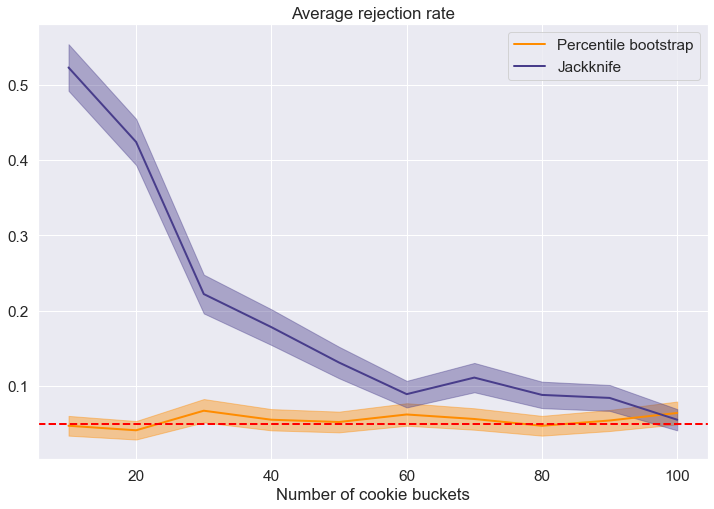

In [501]:
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_percentile_99, c='DarkOrange', label='Percentile bootstrap')
# plt.plot(num_of_cookie_buckets, aver_one_cor_rej_rate_bca_50,  c='DarkSeaGreen', label='$BC_a$ bootstrap')
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_jack_99,c='darkslateblue', label='Jackknife')

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_percentile_99 - 1.96 * std_one_cor_rej_rate_percentile_99,
    aver_one_cor_rej_rate_percentile_99 + 1.96*std_one_cor_rej_rate_percentile_99, color='DarkOrange', alpha=0.4)

# plt.fill_between(num_of_cookie_buckets,aver_one_cor_rej_rate_bca_50 - 1.96 * std_one_cor_rej_rate_bca_50,
    # aver_one_cor_rej_rate_bca_50 + 1.96*std_one_cor_rej_rate_bca_50, color='DarkSeaGreen', alpha=0.4)

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_jack_99 - 1.96 * std_one_cor_rej_rate_jack_99,
    aver_one_cor_rej_rate_jack_99 + 1.96*std_one_cor_rej_rate_jack_99, color='darkslateblue', alpha=0.4)

plt.axhline(0.05, color='red', linestyle='dashed')
plt.title('Average rejection rate')
plt.xlabel('Number of cookie buckets')
plt.legend()


plt.savefig('jack_percentile_corr.png',bbox_inches='tight')
plt.show()

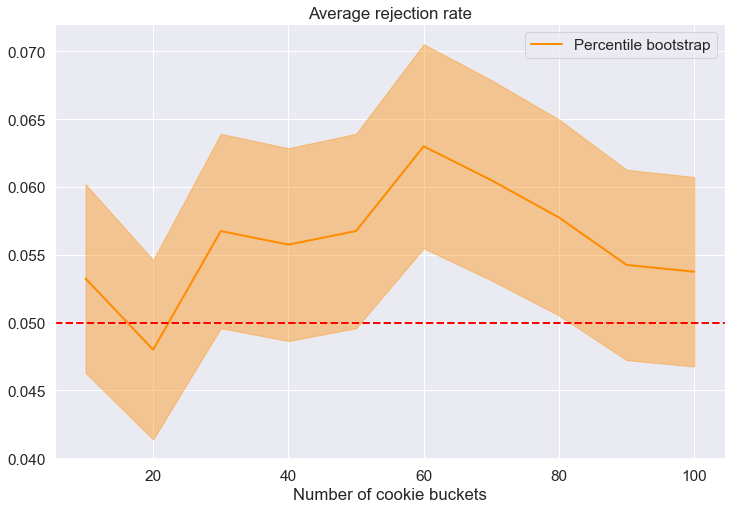

In [387]:
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_percentile_99, c='DarkOrange', label='Percentile bootstrap')
# plt.plot(num_of_cookie_buckets, aver_one_cor_rej_rate_bca_50,  c='DarkSeaGreen', label='$BC_a$ bootstrap')
# plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_jack_99,c='darkslateblue', label='Jackknife')

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_percentile_99 - 1.96 * std_one_cor_rej_rate_percentile_99,
    aver_one_cor_rej_rate_percentile_99 + 1.96*std_one_cor_rej_rate_percentile_99, color='DarkOrange', alpha=0.4)

# plt.fill_between(num_of_cookie_buckets,aver_one_cor_rej_rate_bca_50 - 1.96 * std_one_cor_rej_rate_bca_50,
    # aver_one_cor_rej_rate_bca_50 + 1.96*std_one_cor_rej_rate_bca_50, color='DarkSeaGreen', alpha=0.4)

# plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_jack_99 - 1.96 * std_one_cor_rej_rate_jack_99,
    # aver_one_cor_rej_rate_jack_99 + 1.96*std_one_cor_rej_rate_jack_99, color='darkslateblue', alpha=0.4)

plt.axhline(0.05, color='red', linestyle='dashed')
plt.title('Average rejection rate')
plt.xlabel('Number of cookie buckets')
plt.legend()


# plt.savefig('arr_paired.pdf',bbox_inches='tight')
plt.show()

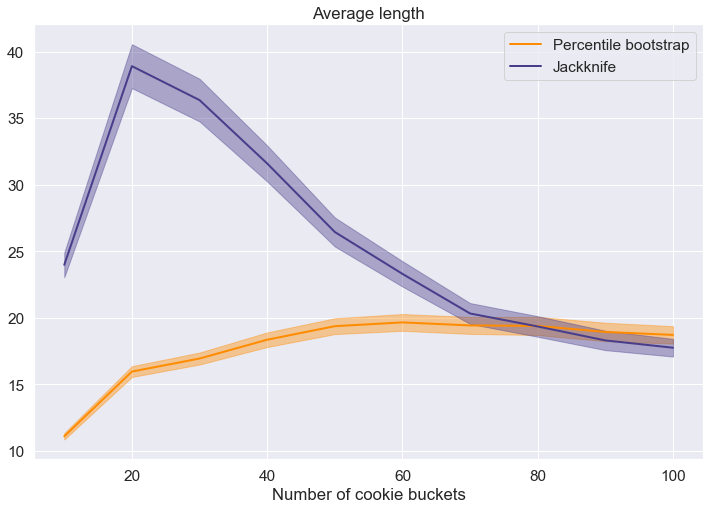

In [502]:
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_length_percentile_99, c='DarkOrange', label = 'Percentile bootstrap')
# plt.plot(num_of_cookie_buckets, aver_one_cor_length_bca_50,  c='DarkSeaGreen', label = '$BC_a$ bootstrap')
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_length_jack_99,c='darkslateblue', label = 'Jackknife')

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_length_percentile_99 - 1.96 * std_one_cor_length_percentile_99,
    aver_one_cor_length_percentile_99 + 1.96*std_one_cor_length_percentile_99, color = 'DarkOrange', alpha=0.4)

# plt.fill_between(num_of_cookie_buckets,aver_one_cor_length_bca_50 - 1.96 * std_one_cor_length_bca_50,
    # aver_one_cor_length_bca_50 + 1.96*std_one_cor_length_bca_50, color='DarkSeaGreen', alpha=0.4)

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_length_jack_99 - 1.96 * std_one_cor_length_jack_99,
    aver_one_cor_length_jack_99 + 1.96*std_one_cor_length_jack_99, color='darkslateblue', alpha=0.4)

plt.title('Average length')
plt.xlabel('Number of cookie buckets')
plt.legend()


# plt.savefig('length_paired.pdf',bbox_inches='tight')
plt.show()

In [388]:
one_cor_varying_res_percentile_95=list()
# one_cor_varying_res_bc_a_99=list()
one_cor_varying_res_jack_95=list()

one_cor_varying_length_percentile_95=list()
# one_cor_varying_length_bc_a_99=list()
one_cor_varying_length_jack_95=list()

one_cor_varying_int_score_percentile_95=list()
# one_cor_varying_int_score_bc_a_99=list()
one_cor_varying_int_score_jack_95=list()


for cur_num_of_cookie_buckets in cand_num_of_cookie_buckets:
    one_cor_varying_res_percentile_95+=[[]]
    # one_cor_varying_res_bc_a_99+=[[]]
    one_cor_varying_res_jack_95+=[[]]

    one_cor_varying_length_percentile_95+=[[]]
    # one_cor_varying_length_bc_a_99+=[[]]
    one_cor_varying_length_jack_95+=[[]]

    one_cor_varying_int_score_percentile_95+=[[]]
    # one_cor_varying_int_score_bc_a_99+=[[]]
    one_cor_varying_int_score_jack_95+=[[]]



In [389]:
for i in range(num_of_sims):

    for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
        # generate bucketed data
        dataset_treat, dataset_control=generate_data_single_corrupted_exp_bucket_level([1000,1000],[200,2000], cur_num_of_cookie_buckets, bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)

        res_percentile = percentile_bootstrap_ci_ratio_cookie_buckets(dataset_treat, dataset_control,
                                            bins_boundaries, 1000, 0.95,
                                            estimator_type='quantile',
                                            quantile=0.95, paired=True, return_interval=True)

        # res_bc_a = bc_a_bootstrap_ratio_cookie_buckets(dataset_treat, dataset_control,
        #                                     bins_boundaries, 1000, 0.95,
        #                                     estimator_type='quantile',
        #                                     quantile=0.99, paired=True,return_interval=True)
        
        res_jack = jackknife_cookie_bucket_quantile_bucketed(dataset_treat, dataset_control,
                                            bins_boundaries, 0.95,
                                            quantile_to_test= 0.95, return_interval=True)

        # add coverage result
        one_cor_varying_res_percentile_95[cur_ind]+=[res_percentile[0]]
        # one_cor_varying_res_bc_a_99[cur_ind]+=[res_bc_a[0]]
        one_cor_varying_res_jack_95[cur_ind]+=[res_jack[0]]

        #add length
        one_cor_varying_length_percentile_95[cur_ind]+=[res_percentile[1][1]-res_percentile[1][0]]
        # one_cor_varying_length_bc_a_99[cur_ind]+=[res_bc_a[1][1]-res_bc_a[1][0]]
        one_cor_varying_length_jack_95[cur_ind]+=[res_jack[1][1]-res_jack[1][0]]

        #add scores
        one_cor_varying_int_score_percentile_95[cur_ind]+=[compute_interval_score(res_percentile[1][1],res_percentile[1][0],1-0.95,0)]
        # one_cor_varying_int_score_bc_a_99[cur_ind]+=[compute_interval_score(res_bc_a[1][1],res_bc_a[1][0],1-0.95,0)]
        one_cor_varying_int_score_jack_95[cur_ind]+=[compute_interval_score(res_jack[1][1],res_jack[1][0],1-0.95,0)]


In [390]:
aver_one_cor_rej_rate_percentile_95 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_res_percentile_95])
aver_one_cor_rej_rate_jack_95 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_res_jack_95])

aver_one_cor_length_percentile_95 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_length_percentile_95])
aver_one_cor_length_jack_95 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_length_jack_95])

aver_one_cor_int_score_percentile_95 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_int_score_percentile_95])
aver_one_cor_int_score_jack_95 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_int_score_jack_95])

std_one_cor_rej_rate_percentile_95 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_res_percentile_95])
std_one_cor_rej_rate_jack_95 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_res_jack_95])

std_one_cor_length_percentile_95 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_length_percentile_95])
std_one_cor_length_jack_95 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_length_jack_95])

std_one_cor_int_score_percentile_95 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_int_score_percentile_95])
std_one_cor_int_score_jack_95 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_int_score_jack_95])


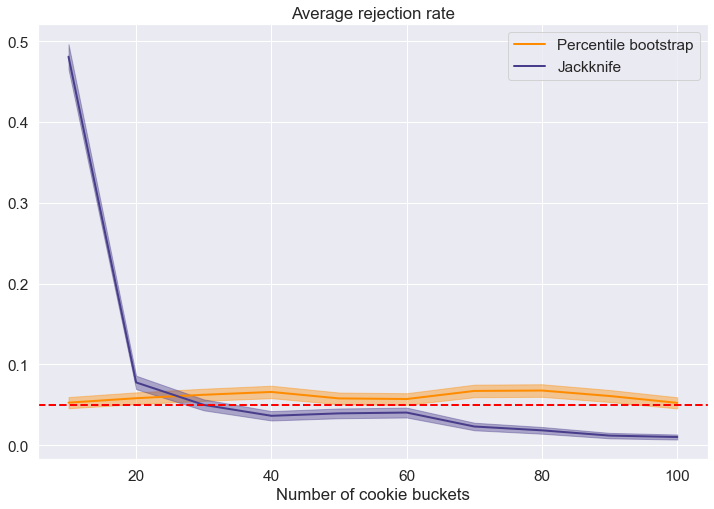

In [391]:
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_percentile_95, c='DarkOrange', label='Percentile bootstrap')
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_jack_95,c='darkslateblue', label='Jackknife')

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_percentile_95 - 1.96 * std_one_cor_rej_rate_percentile_95,
    aver_one_cor_rej_rate_percentile_95 + 1.96*std_one_cor_rej_rate_percentile_95, color='DarkOrange', alpha=0.4)

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_jack_95 - 1.96 * std_one_cor_rej_rate_jack_95,
    aver_one_cor_rej_rate_jack_95 + 1.96*std_one_cor_rej_rate_jack_95, color='darkslateblue', alpha=0.4)

plt.axhline(0.05, color='red', linestyle='dashed')
plt.title('Average rejection rate')
plt.xlabel('Number of cookie buckets')
plt.legend()


# plt.savefig('arr_paired.pdf',bbox_inches='tight')
plt.show()

In [392]:
one_cor_varying_res_percentile_50=list()
one_cor_varying_res_jack_50=list()

one_cor_varying_length_percentile_50=list()
one_cor_varying_length_jack_50=list()

one_cor_varying_int_score_percentile_50=list()
one_cor_varying_int_score_jack_50=list()


for cur_num_of_cookie_buckets in cand_num_of_cookie_buckets:
    one_cor_varying_res_percentile_50+=[[]]
    one_cor_varying_res_jack_50+=[[]]

    one_cor_varying_length_percentile_50+=[[]]
    one_cor_varying_length_jack_50+=[[]]

    one_cor_varying_int_score_percentile_50+=[[]]
    one_cor_varying_int_score_jack_50+=[[]]



In [393]:
for i in range(num_of_sims):

    for cur_ind, cur_num_of_cookie_buckets in enumerate(cand_num_of_cookie_buckets):
        # generate bucketed data
        dataset_treat, dataset_control=generate_data_single_corrupted_exp_bucket_level([1000,1000],[200,2000], cur_num_of_cookie_buckets, bins_boundaries)

        # # bin raw data and place the clients into cookie buckets
        # bucketed_data_treat = pd.DataFrame(dataset_treat)
        # bucketed_data_control = pd.DataFrame(dataset_control)

        res_percentile = percentile_bootstrap_ci_ratio_cookie_buckets(dataset_treat, dataset_control,
                                            bins_boundaries, 1000, 0.95,
                                            estimator_type='quantile',
                                            quantile=0.5, paired=True, return_interval=True)

        # res_bc_a = bc_a_bootstrap_ratio_cookie_buckets(dataset_treat, dataset_control,
        #                                     bins_boundaries, 1000, 0.95,
        #                                     estimator_type='quantile',
        #                                     quantile=0.99, paired=True,return_interval=True)
        
        res_jack = jackknife_cookie_bucket_quantile_bucketed(dataset_treat, dataset_control,
                                            bins_boundaries, 0.95,
                                            quantile_to_test= 0.5, return_interval=True)

        # add coverage result
        one_cor_varying_res_percentile_50[cur_ind]+=[res_percentile[0]]
        # one_cor_varying_res_bc_a_99[cur_ind]+=[res_bc_a[0]]
        one_cor_varying_res_jack_50[cur_ind]+=[res_jack[0]]

        #add length
        one_cor_varying_length_percentile_50[cur_ind]+=[res_percentile[1][1]-res_percentile[1][0]]
        # one_cor_varying_length_bc_a_99[cur_ind]+=[res_bc_a[1][1]-res_bc_a[1][0]]
        one_cor_varying_length_jack_50[cur_ind]+=[res_jack[1][1]-res_jack[1][0]]

        #add scores
        one_cor_varying_int_score_percentile_50[cur_ind]+=[compute_interval_score(res_percentile[1][1],res_percentile[1][0],1-0.95,0)]
        # one_cor_varying_int_score_bc_a_99[cur_ind]+=[compute_interval_score(res_bc_a[1][1],res_bc_a[1][0],1-0.95,0)]
        one_cor_varying_int_score_jack_50[cur_ind]+=[compute_interval_score(res_jack[1][1],res_jack[1][0],1-0.95,0)]


In [394]:
aver_one_cor_rej_rate_percentile_50 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_res_percentile_50])
aver_one_cor_rej_rate_jack_50 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_res_jack_50])

aver_one_cor_length_percentile_50 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_length_percentile_50])
aver_one_cor_length_jack_50 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_length_jack_50])

aver_one_cor_int_score_percentile_50 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_int_score_percentile_50])
aver_one_cor_int_score_jack_50 = np.array([np.mean(cur_sample) for cur_sample in one_cor_varying_int_score_jack_50])

std_one_cor_rej_rate_percentile_50 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_res_percentile_50])
std_one_cor_rej_rate_jack_50 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_res_jack_50])

std_one_cor_length_percentile_50 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_length_percentile_50])
std_one_cor_length_jack_50 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_length_jack_50])

std_one_cor_int_score_percentile_50 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_int_score_percentile_50])
std_one_cor_int_score_jack_50 = np.array([np.std(cur_sample)/np.sqrt(num_of_sims) for cur_sample in one_cor_varying_int_score_jack_50])


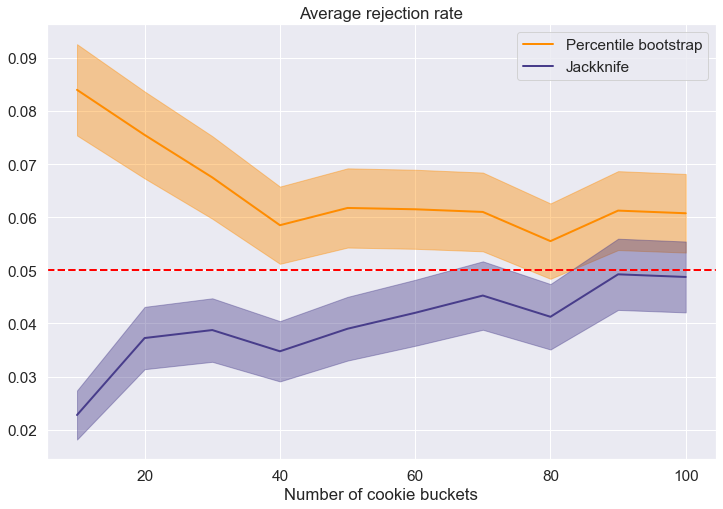

In [395]:
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_percentile_50, c='DarkOrange', label='Percentile bootstrap')
plt.plot(cand_num_of_cookie_buckets, aver_one_cor_rej_rate_jack_50,c='darkslateblue', label='Jackknife')

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_percentile_50 - 1.96 * std_one_cor_rej_rate_percentile_50,
    aver_one_cor_rej_rate_percentile_50 + 1.96*std_one_cor_rej_rate_percentile_50, color='DarkOrange', alpha=0.4)

plt.fill_between(cand_num_of_cookie_buckets,aver_one_cor_rej_rate_jack_50 - 1.96 * std_one_cor_rej_rate_jack_50,
    aver_one_cor_rej_rate_jack_50 + 1.96*std_one_cor_rej_rate_jack_50, color='darkslateblue', alpha=0.4)

plt.axhline(0.05, color='red', linestyle='dashed')
plt.title('Average rejection rate')
plt.xlabel('Number of cookie buckets')
plt.legend()


# plt.savefig('arr_paired.pdf',bbox_inches='tight')
plt.show()